## Startup

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import arch

import os
import pickle

In [5]:
np.random.seed(42)

In [6]:
dataroute=os.path.join("..",  "data")
resultsroute=os.path.join("..",  "results")

## Data Retrieval

In [7]:
start='2013-01-01'
end="2023-06-01"

name=f'processed_dataset_{start}_{end}.pickle'
filename=os.path.join(dataroute, name)

with open(filename, 'rb') as handle:
    data=pickle.load(handle)

## ARCH Training

In [9]:
# Define the range of p and q values
p_values = [0, 1, 2]  # Example: p values
q_values = [0, 1, 2]  # Example: q values

In [10]:
models = {}
predict = {}

In [15]:
# Estimate ARMA-ARCH and ARMA-GARCH models for different p and q values
for key, ohlc_df in data.items():
    returns = ohlc_df['log_rets']
    models[key] = {}
    predict[key] = {}

    for p in p_values:
        for q in q_values:
            for dist in ['Normal', 'StudentsT']:
                model = arch.arch_model(returns, vol='Garch', p=p, q=q, dist=dist)
                results = model.fit()

                models[key][(p, q, dist)] = results

                # Predictions on the training data
                pred = results.predict()
                predict[key][(p, q, dist)] = pred

ValueError: One of p or o must be strictly positive

In [7]:
models={}
comps=[2,3,4]
datacols=["log_rets","gk_vol"]

for key in data.keys():
    print(key)
    for comp in comps:
        print(comp)
        # TODO: Change from single modelname to [key][comp] nested dict
        modelname=f"{key}_{comp}_model"
        predictionname=f"{key}_{comp}_prediction"
        
        X = data[key][datacols].values.reshape(-1, len(datacols))
        # bivariate
        # log returns and intraday volatility        
        models[modelname]=hmm.GaussianHMM(n_components = comp, #no voy a usar startprob_prior por devlog 20-06-23
                                          covariance_type = "diag", 
                                          n_iter = 50,
                                          random_state = 42)
        models[modelname].fit(X)
        models[predictionname]=models[modelname].predict(X)

^MERV
2


Model is not converging.  Current: 18846.005278247954 is not greater than 18847.134444221098. Delta is -1.1291659731432446
Model is not converging.  Current: 18142.20139769384 is not greater than 18142.85021337392. Delta is -0.6488156800805882


3
4


Model is not converging.  Current: 18905.499058655805 is not greater than 18910.228067216696. Delta is -4.729008560891089
Model is not converging.  Current: 18038.2624343628 is not greater than 18038.278369587973. Delta is -0.015935225172142964


GGAL
2
3


Model is not converging.  Current: 18073.008746550106 is not greater than 18076.651123470318. Delta is -3.642376920211973


4
GGAL.BA
2
3
4


Model is not converging.  Current: 18304.593473235505 is not greater than 18308.565609003017. Delta is -3.972135767511645
Model is not converging.  Current: 17756.75997738401 is not greater than 17757.203913438225. Delta is -0.443936054216465


YPF
2
3
4


Model is not converging.  Current: 18369.996877026984 is not greater than 18371.30239834195. Delta is -1.3055213149673364
Model is not converging.  Current: 17798.73799169456 is not greater than 17800.802271672113. Delta is -2.06427997755236


YPFD.BA
2
3


Model is not converging.  Current: 17830.629473372283 is not greater than 17832.10104083943. Delta is -1.4715674671460874


4
EDN
2
3


Model is not converging.  Current: 17080.684098763533 is not greater than 17081.789151608806. Delta is -1.1050528452724393


4


Model is not converging.  Current: 17077.993638007993 is not greater than 17078.23188687198. Delta is -0.2382488639887015


EDN.BA
2
3


Model is not converging.  Current: 17066.381572369566 is not greater than 17070.79977475828. Delta is -4.4182023887151445
Model is not converging.  Current: 17085.17881044322 is not greater than 17088.685822045376. Delta is -3.507011602156126
Model is not converging.  Current: 17947.094485930793 is not greater than 17949.89450591947. Delta is -2.800019988677377


4
BMA
2
3
4


Model is not converging.  Current: 18008.552831003428 is not greater than 18015.43153979727. Delta is -6.878708793843543
Model is not converging.  Current: 17313.299635746713 is not greater than 17317.363432490998. Delta is -4.063796744285355


BMA.BA
2
3
4


Model is not converging.  Current: 21247.674640540492 is not greater than 21249.126418425007. Delta is -1.4517778845147404
Model is not converging.  Current: 20429.677487024546 is not greater than 20429.7433032247. Delta is -0.06581620015276712


USD_GGAL
2
3
4


Model is not converging.  Current: 21252.80502130624 is not greater than 21252.974330425954. Delta is -0.1693091197121248


USD_YPF
2
3
4


Model is not converging.  Current: 19728.314739317448 is not greater than 19729.96415354752. Delta is -1.6494142300725798


USD_EDN
2
3


Model is not converging.  Current: 19728.048243246536 is not greater than 19732.180406605632. Delta is -4.132163359096012


4
USD_BMA
2


Model is not converging.  Current: 21090.250653565647 is not greater than 21091.268319301555. Delta is -1.01766573590794
Model is not converging.  Current: 20256.947686131723 is not greater than 20257.63595786917. Delta is -0.6882717374464846


3
4


Model is not converging.  Current: 21093.163464805806 is not greater than 21093.90066998338. Delta is -0.7372051775746513


USD
2
3


Model is not converging.  Current: 21535.656358535536 is not greater than 21535.89830316691. Delta is -0.24194463137246203
Model is not converging.  Current: 19946.186981522354 is not greater than 19948.99284249492. Delta is -2.805860972566734


4
USD_^MERV
2
3
4


Model is not converging.  Current: 20007.553148425937 is not greater than 20007.581922967158. Delta is -0.028774541220627725


In [8]:
# Predict the hidden states corresponding to observed X.
for key in data.keys():
    for comp in comps:
        print(">"*30, key)
        model=models[f"{key}_{comp}_model"]
        prediction=models[f"{key}_{comp}_prediction"]
        print("unique states: ", pd.unique(prediction))
        print("\nStart probabilities:")
        print(model.startprob_)
        print("\nTransition matrix:")
        print(model.transmat_)
        print("\nGaussian distribution means:")
        print(model.means_)
        print("\nGaussian distribution covariances:")
        print(model.covars_)
        print()

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> ^MERV
unique states:  [0 1]

Start probabilities:
[9.99999992e-01 7.77089851e-09]

Transition matrix:
[[0.99190044 0.00809956]
 [0.64107689 0.35892311]]

Gaussian distribution means:
[[ 0.0023665   0.00062083]
 [-0.03635524  0.0146091 ]]

Gaussian distribution covariances:
[[[4.65243073e-04 0.00000000e+00]
  [0.00000000e+00 4.63173289e-06]]

 [[1.44224149e-02 0.00000000e+00]
  [0.00000000e+00 1.50614206e-03]]]

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> ^MERV
unique states:  [1 0 2]

Start probabilities:
[2.64082753e-02 9.73591725e-01 1.62699196e-11]

Transition matrix:
[[1.36233321e-03 9.98614722e-01 2.29446306e-05]
 [9.77992322e-01 1.06337631e-02 1.13739147e-02]
 [2.70638123e-01 2.45724508e-01 4.83637369e-01]]

Gaussian distribution means:
[[ 0.00147874  0.0006487 ]
 [ 0.00320576  0.00061345]
 [-0.03997792  0.01558215]]

Gaussian distribution covariances:
[[[5.03860880e-04 0.00000000e+00]
  [0.00000000e+00 8.81549832e-06]]

 [[4.56882297e-04 0.00000000e+00]
  [0.00

In [23]:
def plot_close_rets_vol(data, key, comp):
    model=models[f"{key}_{comp}_model"]
    prediction=models[f"{key}_{comp}_prediction"]
    states=set(prediction)

    fig=plt.figure(figsize = (20, 20))
    plt.tight_layout()
    plt.title(f"{key} Close, Log returns and intraday Vol\n{comp} states")

    for subplot, var in zip(range(1,4), ["Close", "log_rets", "gk_vol"]):    
        plt.subplot(3,1,subplot)
        for i in set(prediction):
            state = (prediction == i)
            x = data[key].index[state]
            y = data[key][var].iloc[state]
            plt.plot(x, y, '.')
        plt.legend(states, fontsize=16)
        
        plt.grid(True)
        plt.xlabel("datetime", fontsize=16)
        plt.ylabel(var, fontsize=16)
            
    plt.savefig(os.path.join(resultsroute, "graphs", 
                             f"{comp}_states", 
                             f"{key}_model_{comp}.png"))

C:\Users\Alfred\AppData\Local\Temp\ipykernel_15572\90162184.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,1,subplot)
C:\Users\Alfred\AppData\Local\Temp\ipykernel_15572\90162184.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize = (20, 20))


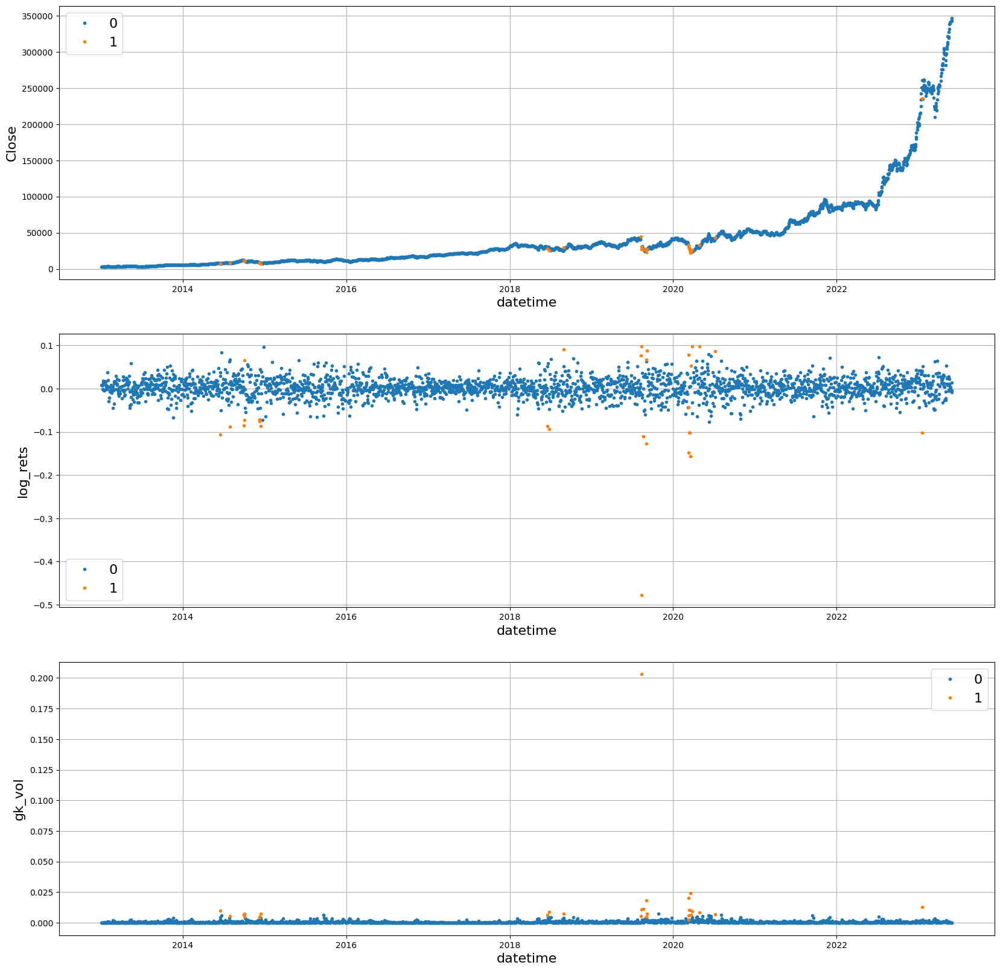

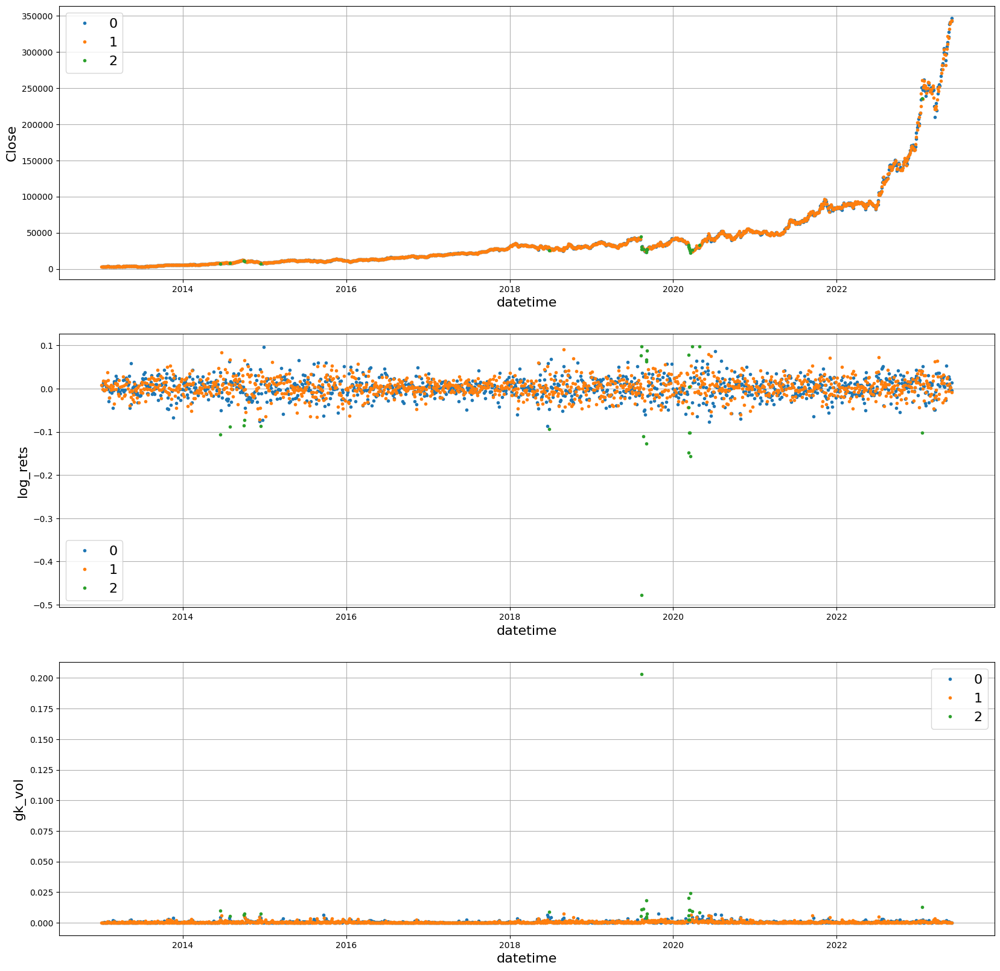

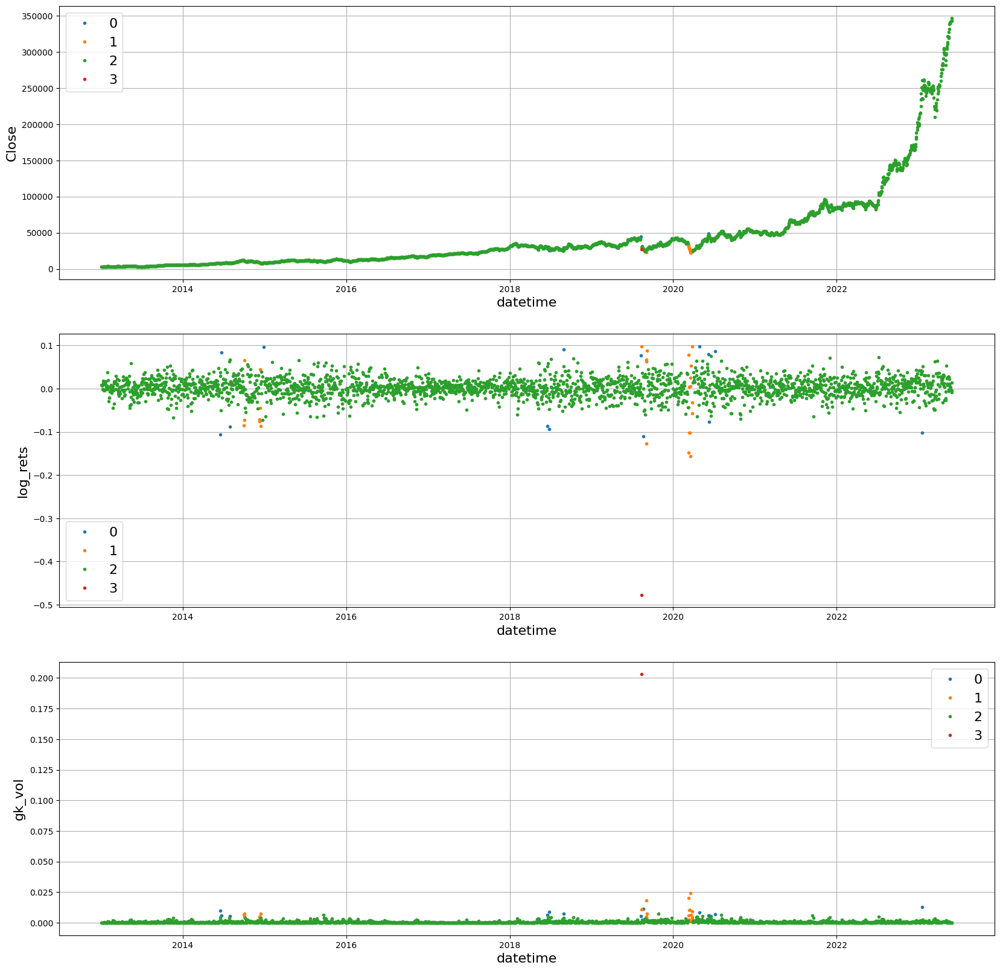

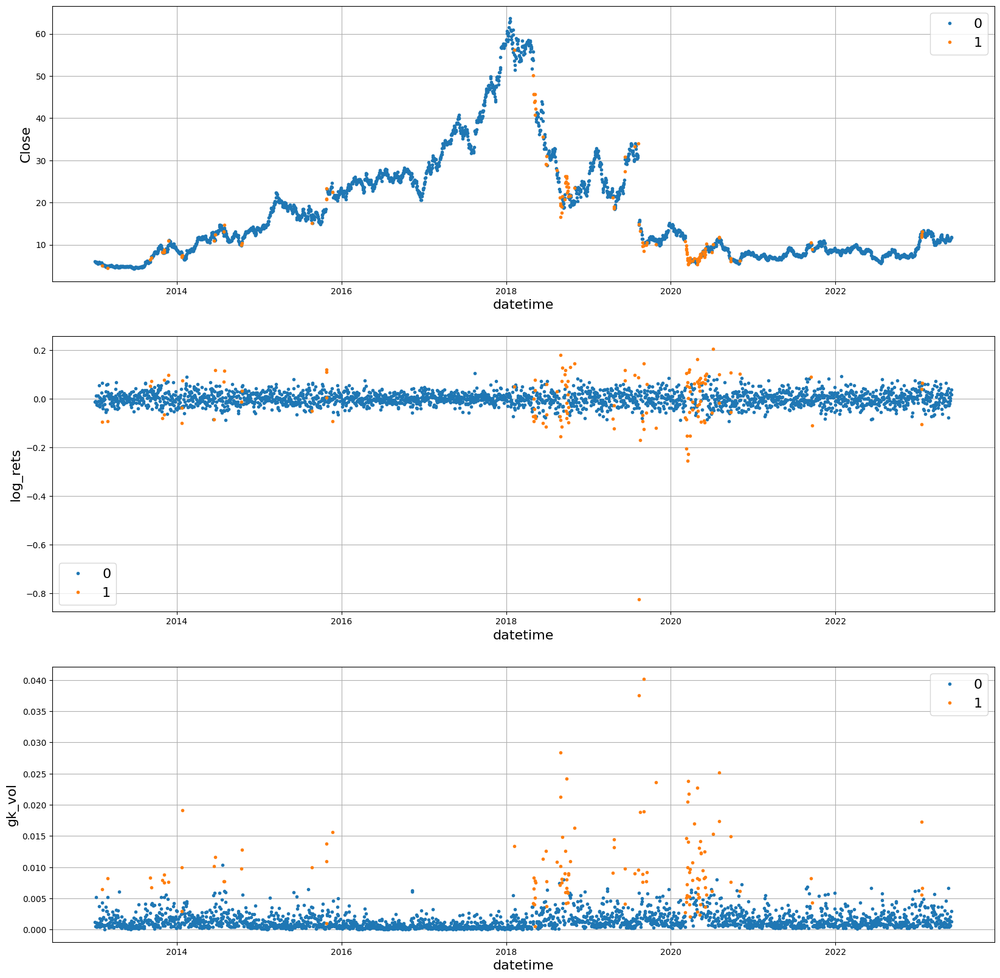

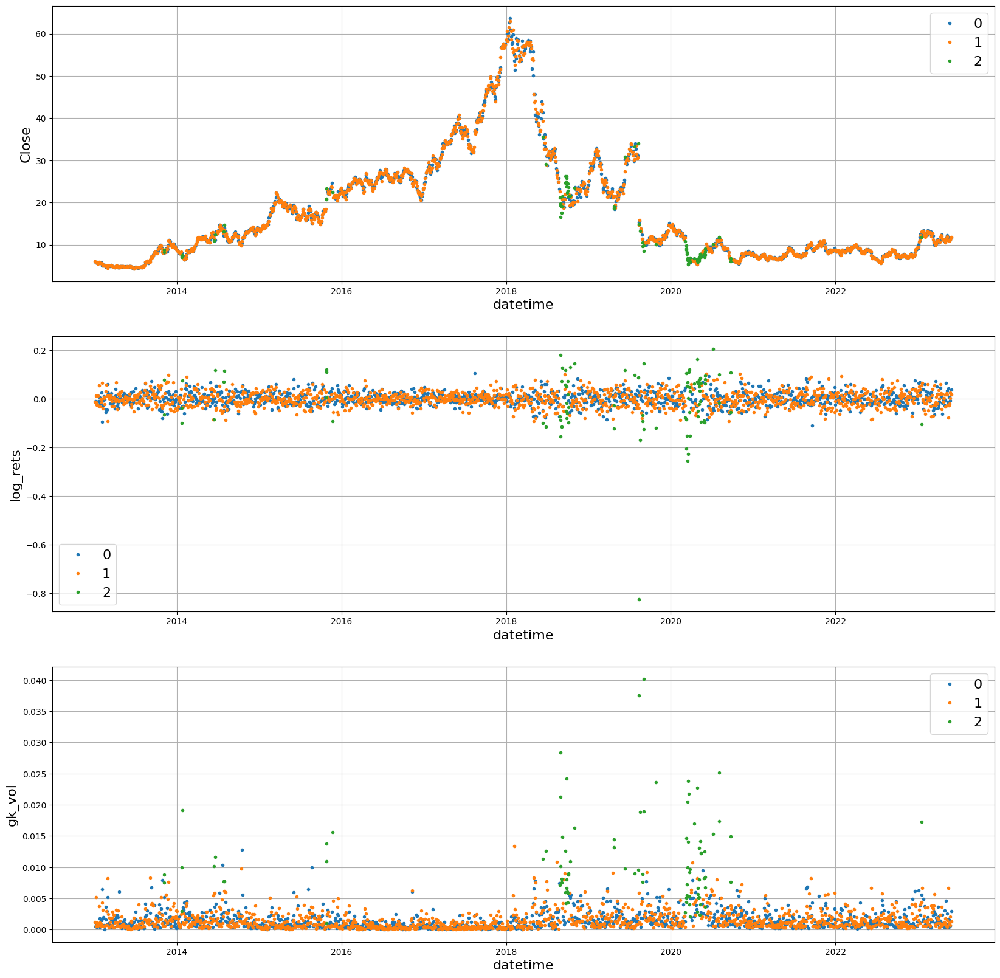

...

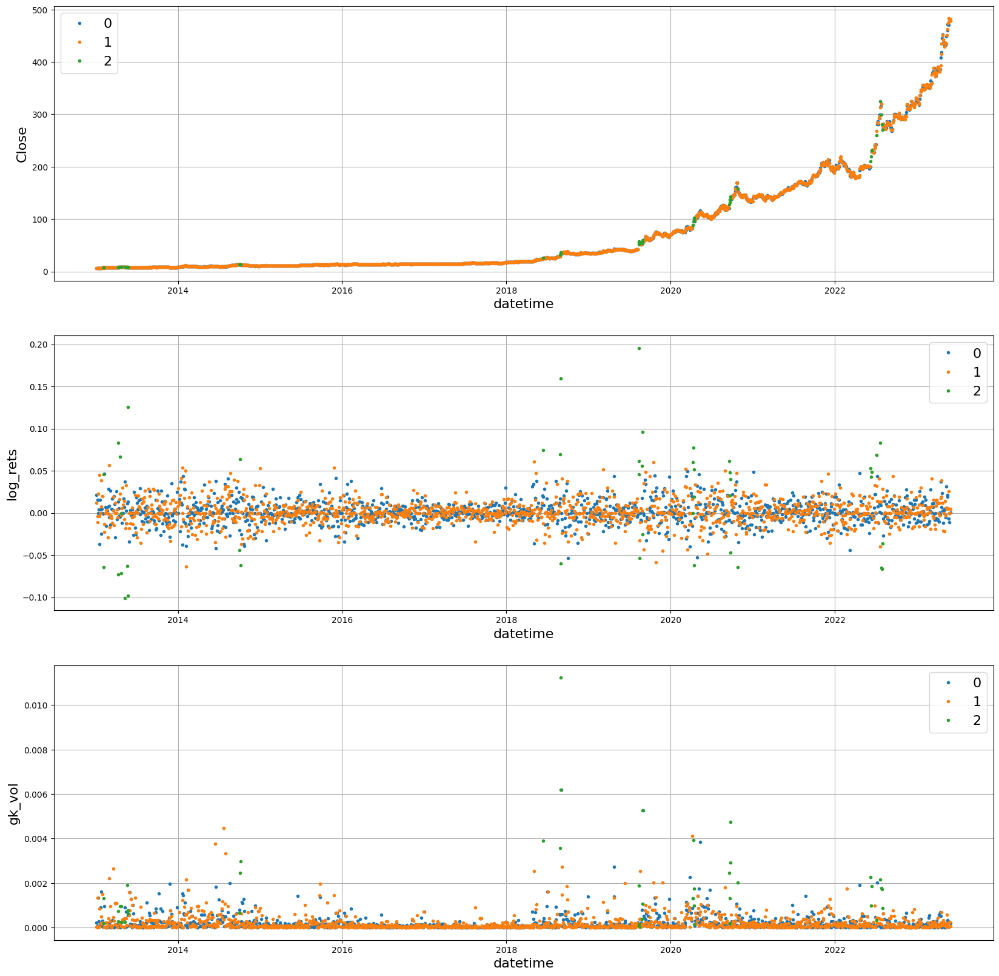

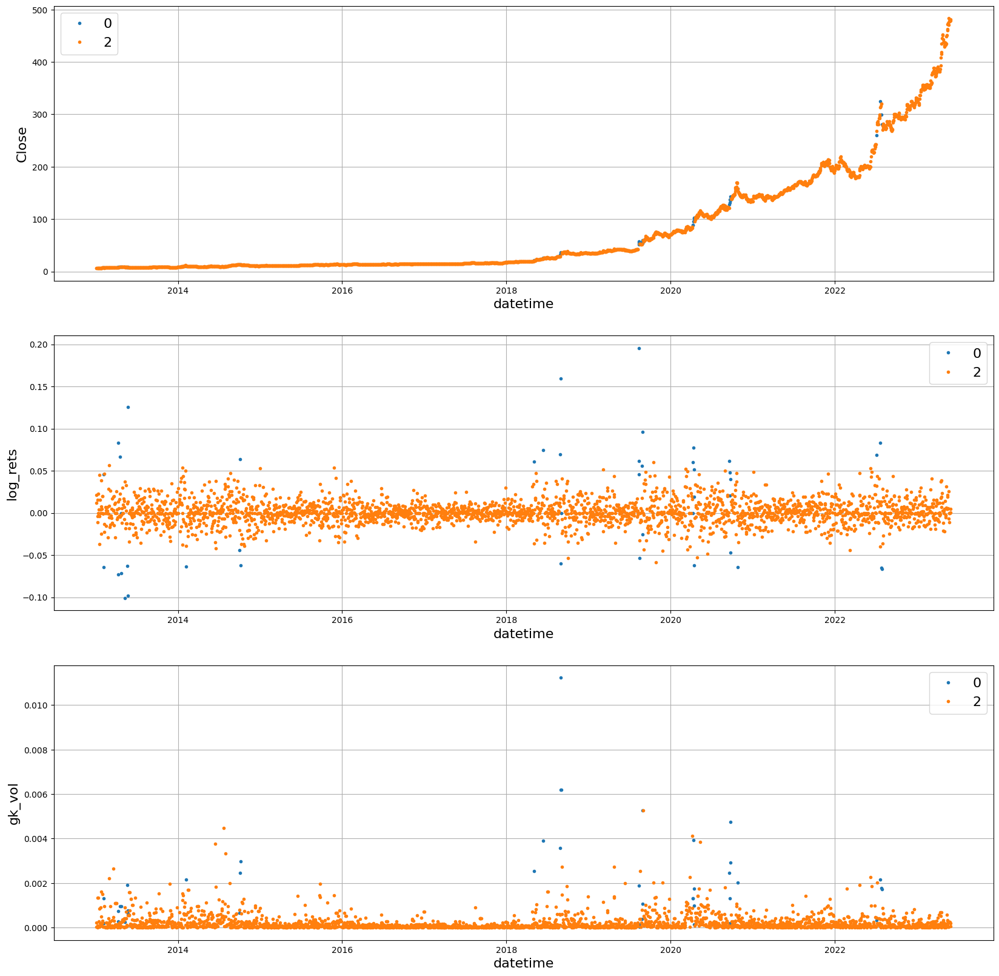

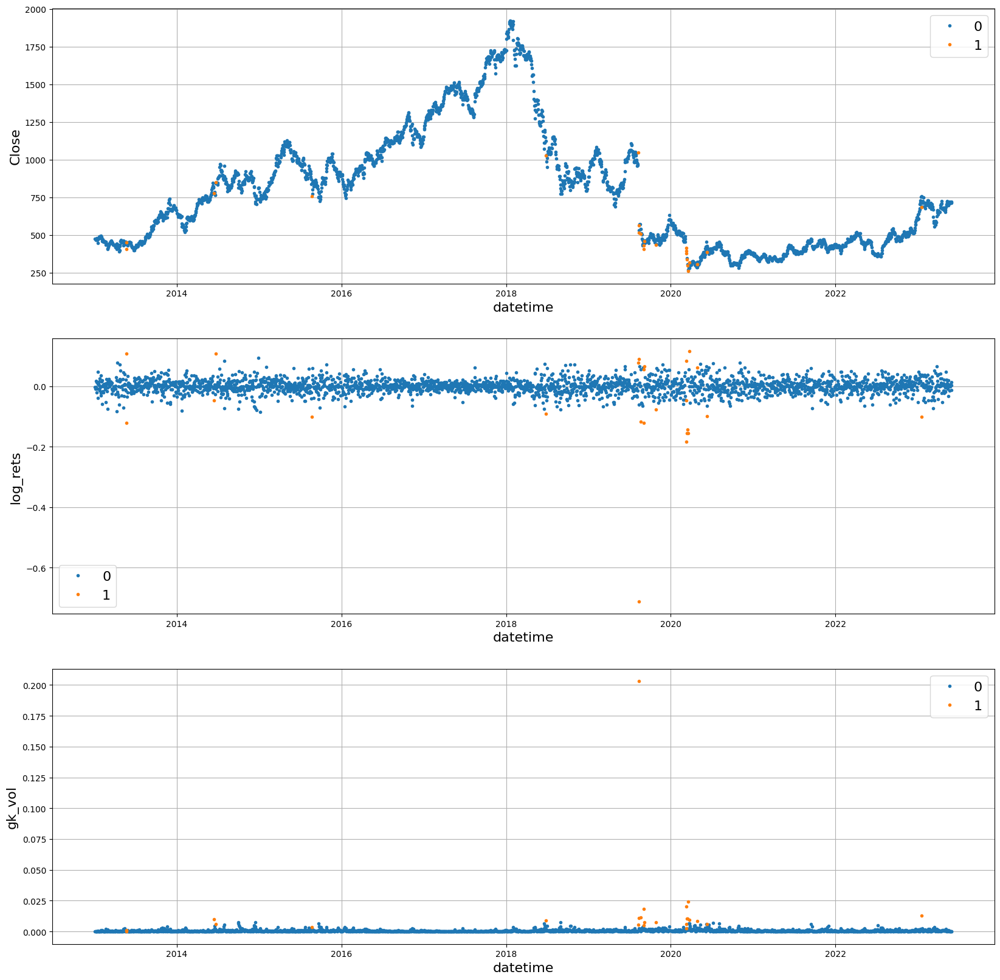

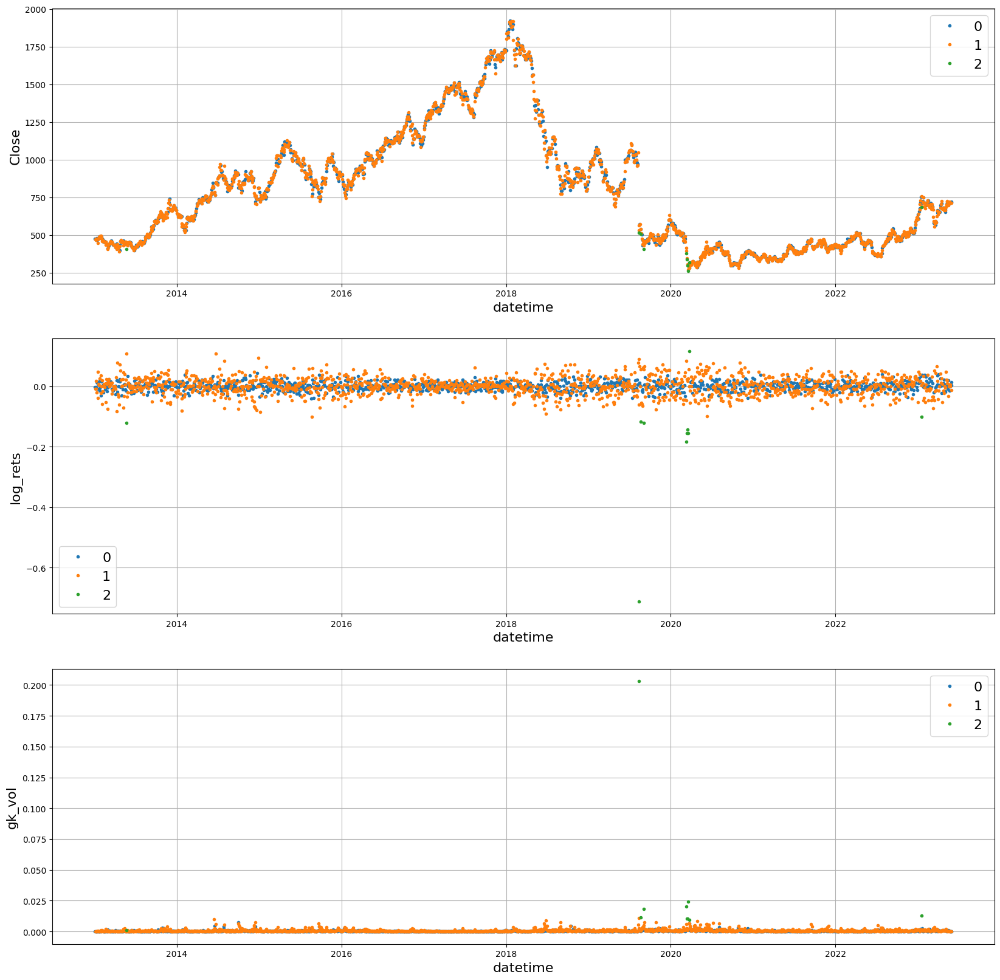

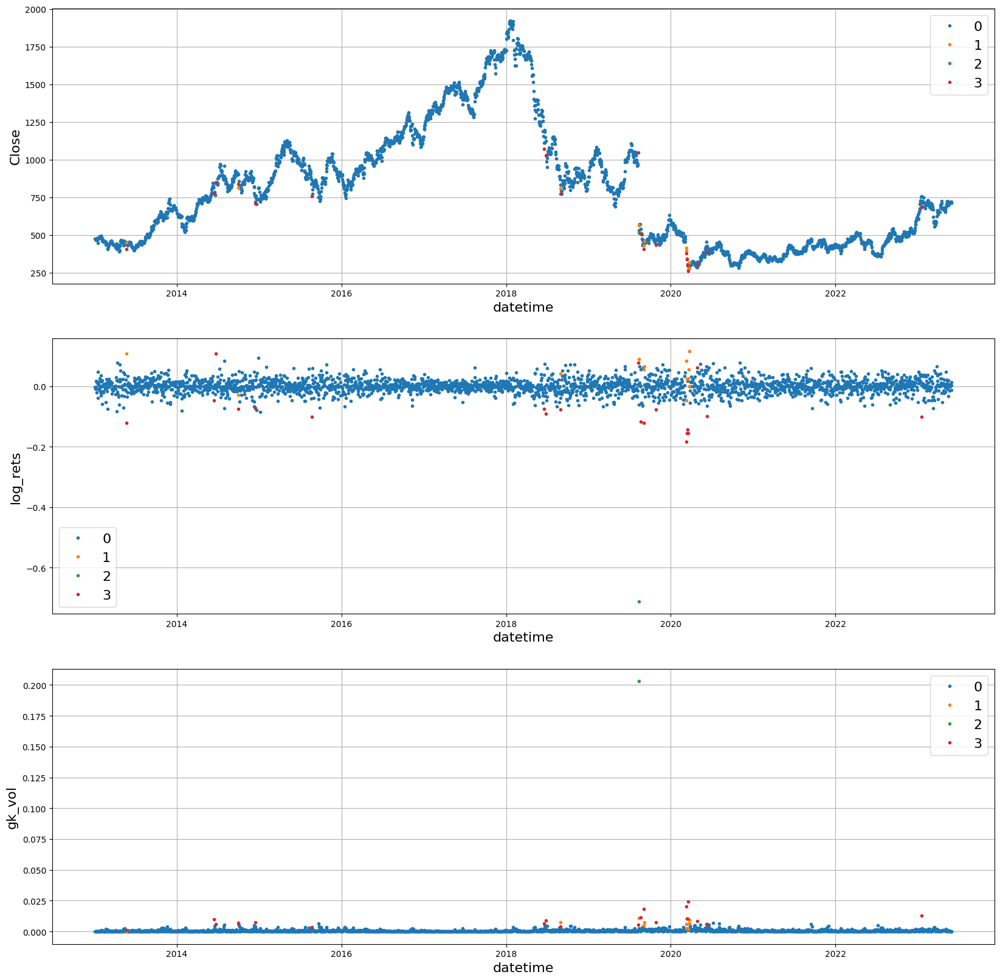

In [24]:
for key in data.keys():
    for comp in comps:
        plot_close_rets_vol(data, key, comp)
plt.show()

## HMM Selection

Selecting the Number of States in Hidden Markov Models: Pragmatic Solutions Illustrated Using Animal Movement
https://sci-hub.st/10.1007/s13253-017-0283-8

Posiblemente requiera armar una funcion de chequeo que use model.monitor==True para chequear convergencia del modelo.  
Recien ahi rankear por AIC&BIC

https://hmmlearn.readthedocs.io/en/latest/api.html#hmmlearn.base.ConvergenceMonitor